In [1]:
import pandas as pd
import numpy as np

weather = pd.read_csv("weather.csv", index_col="DATE")

In [23]:
weather

,station,name,prcp,snow,snwd,tmax,tmin,y,ds
DATE,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,31.0,1970-01-01
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,38.0,1970-01-02
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,31.0,1970-01-03
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,35.0,1970-01-04
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,36.0,1970-01-05
...,...,...,...,...,...,...,...,...,...
2022-10-17,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.08,0.0,0.0,67,54,58.0,2022-10-17
2022-10-18,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,58,48,56.0,2022-10-18
2022-10-19,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,56,43,61.0,2022-10-19


In [2]:
# Clean invalid columns
null_pct = weather.apply(pd.isnull).sum()/weather.shape[0]
valid_columns = weather.columns[null_pct < .05]

In [3]:
weather = weather[valid_columns].copy()
weather.columns = weather.columns.str.lower()

In [4]:
weather.index = pd.to_datetime(weather.index)

In [5]:
# Setup time series for prophet
weather["y"] = weather.shift(-1)["tmax"]
weather = weather.ffill()

In [6]:
weather["ds"] = weather.index

In [7]:
weather.shape

(19287, 9)

In [8]:
predictors = weather.columns[~weather.columns.isin(["y", "name", "station", "ds"])]

In [9]:
train = weather[:"2021-12-31"]
test = weather["2021-12-31":]

In [10]:
# Fit initial prophet model
from prophet import Prophet

def fit_prophet(train):
    m = Prophet()
    for p in predictors:
        m.add_regressor(p)
    m.fit(train)
    return m

m = fit_prophet(train)

22:14:20 - cmdstanpy - INFO - Chain [1] start processing
22:14:22 - cmdstanpy - INFO - Chain [1] done processing


In [11]:
predictions = m.predict(test)

In [12]:
predictions

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-12-31,62.284237,42.867597,58.854989,62.284237,62.284237,-11.613591,-11.613591,-11.613591,-3.665895,...,0.011187,0.011187,0.011187,-7.958882,-7.958882,-7.958882,0.0,0.0,0.0,50.670646
1,2022-01-01,62.284262,42.653988,58.452276,62.284262,62.284262,-11.930802,-11.930802,-11.930802,-3.855389,...,-0.070820,-0.070820,-0.070820,-8.004593,-8.004593,-8.004593,0.0,0.0,0.0,50.353460
2,2022-01-02,62.284287,43.286111,58.778136,62.284287,62.284287,-11.719685,-11.719685,-11.719685,-3.715078,...,0.043693,0.043693,0.043693,-8.048299,-8.048299,-8.048299,0.0,0.0,0.0,50.564603
3,2022-01-03,62.284313,30.931627,47.885724,62.284313,62.284313,-23.198224,-23.198224,-23.198224,-15.455732,...,0.347508,0.347508,0.347508,-8.090000,-8.090000,-8.090000,0.0,0.0,0.0,39.086089
4,2022-01-04,62.284338,27.724235,43.932228,62.284338,62.284338,-26.613248,-26.613248,-26.613248,-18.437249,...,-0.046321,-0.046321,-0.046321,-8.129679,-8.129679,-8.129679,0.0,0.0,0.0,35.671090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
290,2022-10-17,62.291598,58.879586,74.995674,62.288532,62.294567,4.910750,4.910750,4.910750,3.874263,...,0.347508,0.347508,0.347508,0.688978,0.688978,0.688978,0.0,0.0,0.0,67.202348
291,2022-10-18,62.291623,53.748725,69.442051,62.288522,62.294649,-0.462262,-0.462262,-0.462262,-0.980028,...,-0.046321,-0.046321,-0.046321,0.564087,0.564087,0.564087,0.0,0.0,0.0,61.829361
292,2022-10-19,62.291649,50.854918,67.236741,62.288538,62.294692,-2.990705,-2.990705,-2.990705,-3.194288,...,-0.234780,-0.234780,-0.234780,0.438362,0.438362,0.438362,0.0,0.0,0.0,59.300944
293,2022-10-20,62.291674,52.870391,69.618622,62.288555,62.294729,-0.906103,-0.906103,-0.906103,-1.167348,...,-0.050467,-0.050467,-0.050467,0.311712,0.311712,0.311712,0.0,0.0,0.0,61.385571


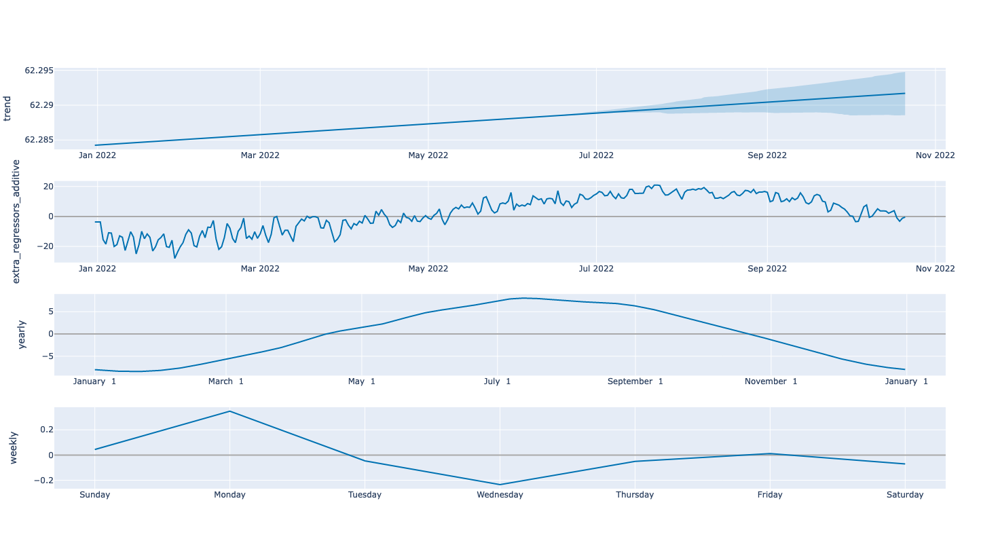

In [13]:
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric

plot_components_plotly(m, predictions)

In [14]:
from prophet.utilities import regressor_coefficients

regressor_coefficients(m)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,prcp,additive,0.118130,-0.945513,-0.945513,-0.945513
1,snow,additive,0.064540,-0.560852,-0.560852,-0.560852
2,snwd,additive,0.209635,-0.057523,-0.057523,-0.057523
3,tmax,additive,61.758648,0.344367,0.344367,0.344367
4,tmin,additive,47.494024,0.305105,0.305105,0.305105


In [15]:
predictions.index = test.index
predictions["actual"] = test["y"]

In [16]:
predictions["se"] = ((predictions["actual"] - predictions["yhat"]) ** 2)
print(predictions["se"].mean())

42.55756740586564


In [18]:
# Cross validate across data set
from prophet.diagnostics import cross_validation, performance_metrics


m = fit_prophet(weather)
cv = cross_validation(m, initial=f'{365 * 5} days', period='180 days', horizon = '180 days', parallel="processes")

22:14:30 - cmdstanpy - INFO - Chain [1] start processing
22:14:30 - cmdstanpy - INFO - Chain [1] start processing
22:14:30 - cmdstanpy - INFO - Chain [1] start processing
22:14:30 - cmdstanpy - INFO - Chain [1] done processing
22:14:30 - cmdstanpy - INFO - Chain [1] start processing
22:14:30 - cmdstanpy - INFO - Chain [1] start processing
22:14:30 - cmdstanpy - INFO - Chain [1] start processing
22:14:30 - cmdstanpy - INFO - Chain [1] done processing
22:14:30 - cmdstanpy - INFO - Chain [1] start processing
22:14:30 - cmdstanpy - INFO - Chain [1] done processing
22:14:30 - cmdstanpy - INFO - Chain [1] start processing
22:14:30 - cmdstanpy - INFO - Chain [1] start processing
22:14:30 - cmdstanpy - INFO - Chain [1] start processing
22:14:30 - cmdstanpy - INFO - Chain [1] done processing
22:14:30 - cmdstanpy - INFO - Chain [1] done processing
22:14:31 - cmdstanpy - INFO - Chain [1] done processing
22:14:31 - cmdstanpy - INFO - Chain [1] start processing
22:14:31 - cmdstanpy - INFO - Chain [

In [19]:
performance_metrics(cv)

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,18 days,35.488695,5.957239,4.733085,0.087801,0.064338,0.085754,0.805842
1,19 days,35.390703,5.949009,4.730858,0.087789,0.064419,0.085752,0.806987
2,20 days,35.798633,5.983196,4.766761,0.088508,0.064454,0.086482,0.801260
3,21 days,35.920056,5.993334,4.777752,0.088574,0.065362,0.086644,0.805269
4,22 days,36.438925,6.036466,4.802010,0.089527,0.065362,0.087403,0.799542
...,...,...,...,...,...,...,...,...
158,176 days,38.582354,6.211470,4.859321,0.090907,0.064829,0.087970,0.794960
159,177 days,37.990554,6.163648,4.818952,0.090661,0.064289,0.087575,0.796105
160,178 days,37.847237,6.152011,4.814474,0.090268,0.064083,0.087398,0.793814
161,179 days,37.999494,6.164373,4.833724,0.090335,0.064412,0.087661,0.796105


<AxesSubplot:>

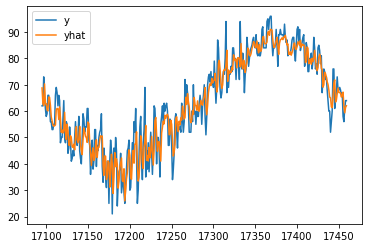

In [21]:
cv[["y", "yhat"]][-365:].plot()

In [22]:
# Predict one day ahead with high accuracy
m = fit_prophet(weather)
m.predict(weather.iloc[-1:])

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2022-10-21,62.39037,53.171718,69.701442,62.39037,62.39037,-0.293831,-0.293831,-0.293831,-0.475081,...,-0.005438,-0.005438,-0.005438,0.186688,0.186688,0.186688,0.0,0.0,0.0,62.096539


In [24]:
# Predict multiple days ahead with lower accuracy
m = Prophet()
m.fit(weather)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

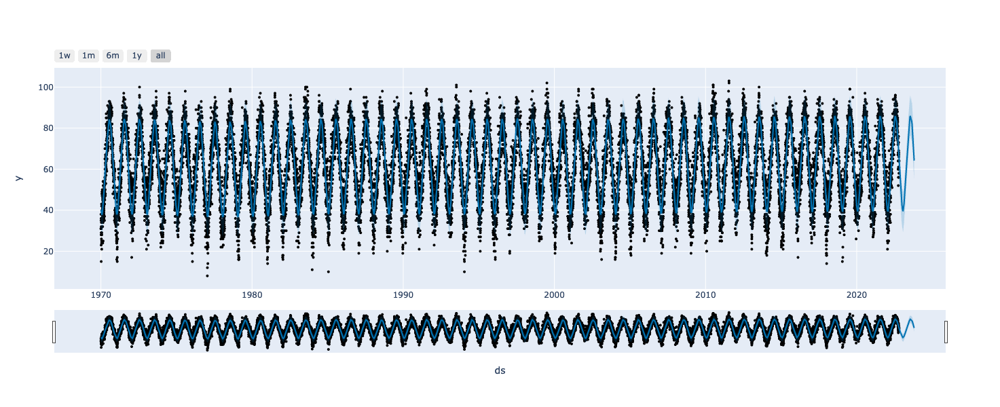

In [25]:
from prophet.plot import plot_plotly

plot_plotly(m, forecast)